In [19]:
# 上诉代码没有共享模型
import torch
import torch.nn as nn
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,recall_score, accuracy_score, roc_auc_score,cohen_kappa_score,confusion_matrix,precision_score
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
import copy
import os
import random
from sklearn.cluster import KMeans
from numpy.linalg import norm
from sklearn.neighbors import NearestNeighbors

# 定义MLP模型
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x

class IncrementalSampling(object):
    def __init__(self,prototype_nums = 10):
        self.incremental_data_map = {}
        self.data  = np.array([])
        self.label = np.array([])
        self.k_value = prototype_nums
    def split_current_data_by_class(self):
        """把当前轮的数据按类别划分"""
        # 获取唯一的类别标签
        current_unique_labels = np.unique(self.label)
        # 按类别分割当前轮获得的数据
        data_by_class = {}  # map {"label":[the data belong to the label]}
        for current_data_label in current_unique_labels:
            indices = np.where(self.label == current_data_label)[0]
            data_by_class[current_data_label] = self.data[indices]
        return data_by_class, current_unique_labels
    def data_combined(self):
        """把当前轮的数据，和类map中的数据进行合并"""
        current_data_map_by_class, current_unique_labels = self.split_current_data_by_class()
        # 考虑到有新类出现的情况
        # 如果current_unique_labels有新label,直接扩充incremental_data_map
        # 如果label 是incremental_data_map中已经有的，扩张incremental_data_map对应label中data的长度
        for new_data_label in current_unique_labels:
            if new_data_label in self.incremental_data_map:
                # 增量map中已经有这个标签的数据了，那就扩充这个数据
                self.incremental_data_map[new_data_label] = np.concatenate(
                    (self.incremental_data_map[new_data_label], current_data_map_by_class[new_data_label])
                )
            else:
                # 如果增量map中没有这个标签的的数据，就扩充增量map
                self.incremental_data_map[new_data_label] = current_data_map_by_class[new_data_label]
    def cluster_data(self,data, num_clusters):
        # kmeans = KMeans(n_clusters=num_clusters,n_init='auto')
        kmeans = KMeans(n_clusters=num_clusters)
        kmeans.fit(data)
        cluster_centers = kmeans.cluster_centers_
        return  cluster_centers
    def reCludter(self):
        # incremental_data_map的大小进行压缩self.reCluster_instance_nums
        new_cluster = {}
        for label, data in self.incremental_data_map.items():
            if len(data) <= self.k_value:
                # 全部保存
                new_cluster[label] = data
            else:
                sampled_nums = self.k_value
                clusters = self.cluster_data(data = data, num_clusters=sampled_nums)
                new_cluster[label] = clusters
        self.incremental_data_map = new_cluster
    def compute_sampling_nums(self,combinde_map):
        # initialize
        min_length = float('inf')  # 初始化最小长度为正无穷大
        max_length = 0  # 初始化最大长度为0
        for label, data in combinde_map.items():
            data_length = len(data)
            if data_length < min_length:
                min_length = data_length
            if data_length > max_length:
                max_length = data_length
        return min_length, max_length
    def data_sampling(self,sampling_nums):
        resampling_data = []
        resampling_label = []
        for label, data in self.incremental_data_map.items():
            if len(data) > sampling_nums:
                # 那就是下采样了,不放回采样
                sampled_indices = random.sample(range(len(data)), sampling_nums)
                sampled_data = [data[i] for i in sampled_indices]
                resampling_data.extend(sampled_data)
                resampling_label.extend([label] * sampling_nums)
            elif len(data) == sampling_nums:
                # 直接复制
                resampling_data.extend(data)
                resampling_label.extend([label] * sampling_nums)
            else:
                # 上采样,保存原样本
                resampling_data.extend(data)
                # 随机有放回的找差额部分
                sampled_data = random.choices(data, k=(sampling_nums-len(data)))
                resampling_data.extend(sampled_data)
                resampling_label.extend([label] * sampling_nums)
        # 洗牌
        combined_data = list(zip(resampling_data, resampling_label))
        random.shuffle(combined_data)
        resampling_data, resampling_label = zip(*combined_data)
        return resampling_data,resampling_label
    def fit(self,incremental_prototype_map,data,label,sampling_strategy = "OverSampling"):
        self.incremental_data_map = incremental_prototype_map
        self.data = data
        self.label = label
        self.data_combined()
        resampling_data = []
        resampling_label = []
        min_length, max_length =self.compute_sampling_nums(self.incremental_data_map)
        if sampling_strategy.lower() == "oversampling":
            resampling_data,resampling_label = self.data_sampling(max_length)
        elif sampling_strategy.lower() == "downsampling":
            resampling_data,resampling_label = self.data_sampling(min_length)
        else:
            print("No sampling measures have been taken")
        self.reCludter()
        return resampling_data,resampling_label,self.incremental_data_map

class Triplets(object):
    def __init__(self, n_neighbors=5, random=True, len_lim=True, **kwargs):
        self.n_neighbors = n_neighbors
        self.random = random
        self.len_lim = len_lim

    def fit_resample(self, x, y):
        strategy = self._sample_strategy(y)
        self.n_neighbors = max(self.n_neighbors, self.counts.max() // self.counts.min())

        gen_x = []
        gen_y = []
        # 这里的代码平衡状态会报错
        for c, size in enumerate(strategy):
            if size == 0: continue
            weight = self._weights(x, y, c)
            gen_x_c, gen_y_c = self._sample_one(x, y, c, size, weight)
            gen_x += gen_x_c
            gen_y += gen_y_c

        # 为了这个方法在平衡状态下不报错，我们特地在这里加了这段代码
        # To prevent errors in this method when in a balanced state, we intentionally added this code block
        if len(gen_x)==0:
            return x,y
        gen_x = np.vstack(gen_x)
        gen_y = np.array(gen_y)
        return np.concatenate((x, gen_x), axis=0), np.concatenate((y, gen_y), axis=0)

    def _sample_strategy(self, y):
        _, self.counts = np.unique(y, return_counts=True)
        return max(self.counts) - self.counts

    def _weights(self, x, y, c):
        return np.ones(self.counts[c])

    def _sample_one(self, x, y, c, size, weight):
        gen_x = []
        gen_y = []
        if size == 0: return gen_x, gen_y

        # get the indices of minority and majority instances
        min_idxs = np.where(y == c)[0]
        maj_idxs = np.where(y != c)[0]

        # find nearest majority neighbors for each minority instance
        nbrs = NearestNeighbors(n_neighbors=self.n_neighbors).fit(x[maj_idxs])
        _, indices = nbrs.kneighbors(x[min_idxs])

        # generate synthetic data
        for j in np.random.choice(len(min_idxs), size, p=weight / weight.sum()):
            tp1 = x[min_idxs[j]]
            tp2 = x[maj_idxs[indices[j][:5]]].mean(axis=0)
            # tp3_ord = np.random.randint(1, self.n_neighbors)
            tp3_ord = np.random.randint(self.n_neighbors)
            tp3 = x[maj_idxs[indices[j][tp3_ord]]]
            if (tp2 == tp1).all():
                gen_x.append(tp1)
                gen_y.append(c)
                continue

            offset = tp3 - tp2
            if self.len_lim: offset = offset * min(1, norm(tp1 - tp2) / norm(offset))
            coef = np.random.rand() if self.random is True else 1.0
            new_x = tp1 + coef * offset
            gen_x.append(new_x)
            gen_y.append(c)
        return gen_x, gen_y

def train_model_FedAvg_local(input_model,X_train_tensor, y_train_tensor, num_epochs):
    losses =[]
    model = input_model# copy.deepcopy(input_model)
    optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    model.train()
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        loss.backward()
        optimizer.step()
        if epoch % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")
        losses.append(loss.item())  # 将每次训练的损失值添加到列表中

    return losses
def train_model_FedProx_local(input_model, X_train_tensor, y_train_tensor, num_epochs):
    mu = 0.1
    # because last round trained global model replaced local model,
    # that in this round the first local model is last round global model
    losses =[]
    model = input_model# copy.deepcopy(input_model)
    optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    global_weights = copy.deepcopy(list(model.parameters()))
    # not use deepcopy ,because model as parameter transport in this ,update model also update model
    # current_local_model = cmodel
    # model.train()
    # for epoch in range(num_epochs):
    model.train()
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        # FedProx
        prox_term = 0.0
        for p_i, param in enumerate(model.parameters()):
                prox_term += (mu / 2) * torch.norm((param - global_weights[p_i])) ** 2
        loss += prox_term

        loss.backward()
        optimizer.step()
        if epoch % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")
        losses.append(loss.item())  # 将每次训练的损失值添加到列表中
    #     total_loss = 0.0
    #     for step,(x,y) in enumerate(zip(X_train_tensor,y_train_tensor)):
    #         # current_local_model.train()
    #         output = model(x) # current_local_model(x)
    #         loss = criterion(output, y)
    #         total_loss+=loss.item()
    #         optimizer.zero_grad()
    #
    #         # fedprox
    #         prox_term = 0.0
    #         for p_i, param in enumerate(model.parameters()):
    #             prox_term += (mu / 2) * torch.norm((param - global_weights[p_i])) ** 2
    #         loss += prox_term
    #         loss.backward()
    #         optimizer.step()
    #     losses.append(total_loss)
    #     if epoch % 10 == 0:
    #         print(f"Epoch [{epoch+1}/{num_epochs}], Epoch Total Loss: {total_loss:.4f}")
    return losses

def train_model_FedNova_local(input_model,X_train_tensor, y_train_tensor, num_epochs):
    # because last round trained global model replaced local model,
    # that in this round the first local model is last round global model
    losses =[]
    model = input_model
    optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    global_weights = copy.deepcopy(input_model.state_dict())
    tau = 0
    rho = 0.9
    model.train()
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        tau +=len(y_train_tensor)
        loss.backward()
        optimizer.step()
        if epoch % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")
        losses.append(loss.item())
    # for epoch in range(num_epochs):
    #     total_loss = 0.0
    #     for step,(x,y) in enumerate(zip(X_train_tensor,y_train_tensor)):
    #         # current_local_model.train()
    #         # model.train()
    #         output = model(x) # current_local_model(x)
    #         loss = criterion(output, y)
    #         total_loss+=loss.item()
    #         optimizer.zero_grad()
    #         loss.backward()
    #         optimizer.step()
    #         tau +=1
    #     losses.append(total_loss)
    #     if epoch % 10 == 0:
    #         print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss:.4f}")
    coeff = (tau - rho * (1 - pow(rho, tau)) / (1 - rho)) / (1 - rho)
    state_dict = model.state_dict()
    norm_grad = copy.deepcopy(global_weights)
    for key in norm_grad:
        norm_grad[key] = torch.div(global_weights[key] - state_dict[key], coeff)

    return losses, coeff, norm_grad,len(X_train_tensor)
# 定义模型参数共享函数
def share_params(model):
    params = model.state_dict()
    return {k: v.clone().detach().requires_grad_(True) for k, v in params.items()}

# # 定义模型参数聚合函数
def aggregate_params(params_list):
    aggregated_params = {}
    for key in params_list[0].keys():
        # 将参数转换为张量进行处理
        params_tensors = [params[key].clone().detach().float() for params in params_list]
        # 聚合参数
        aggregated_params[key] = sum(params_tensors) / len(params_tensors)
    return aggregated_params
def test(global_model,X_test,y_test):
    # 在全局模型上进行测试
    with torch.no_grad():
        X_test_tensor = torch.FloatTensor(X_test)
        y_test_tensor = torch.LongTensor(y_test)
        outputs = global_model(X_test_tensor)
        _, predicted = torch.max(outputs, 1)
        accuracy = (predicted == y_test_tensor).sum().item() / len(y_test_tensor)
        print(f"Test Accuracy: {accuracy * 100:.2f}%")

        # 计算度量
        predictions = predicted.numpy() # 将张量转换为 NumPy 数组并去除零维数组
        true_labels = y_test_tensor.numpy()  # 将张量转换为 NumPy 数组并去除零维数组
        precision = precision_score(true_labels,predictions,zero_division=0.0,average=None)
        precision_micro = precision_score(true_labels,predictions,zero_division=0.0,average='micro')
        precision_macro = precision_score(true_labels,predictions,zero_division=0.0,average='macro')
        # recall
        recalls = recall_score(true_labels,predictions,zero_division=0.0,average=None)
        recalls_micro =recall_score(true_labels,predictions,zero_division=0.0,average='micro')
        recalls_macro =recall_score(true_labels,predictions,zero_division=0.0,average='macro')
        f1_scores = f1_score(true_labels, predictions, average=None)
        acc = accuracy_score(true_labels, predictions)
        kappa = cohen_kappa_score(true_labels,predictions)
        conf_matrix = confusion_matrix(true_labels,predictions)
        # 计算所有类别乘积的几何平均值作为 G-mean
        g_mean_all= np.power(np.prod(recalls), 1 / len(recalls))
        # AUC
        lb = LabelBinarizer()
        lb.fit(true_labels)
        true_labels_bin = lb.transform(true_labels)
        predictions_bin = lb.transform(predictions)
        auc = roc_auc_score(true_labels_bin, predictions_bin, average='weighted', multi_class='ovr')
        metrics = {
            'recall':recalls,
            'recall_micro':recalls_micro,
            'recall_macro':recalls_macro,
            'precision':precision,
            'precision_micro':precision_micro,
            'precision_macro':precision_macro,
            'f1_score':f1_scores,
            'g_mean':g_mean_all,
            'acc':acc,
            'auc':auc,
            'kappa':kappa,
            'confusion_matrix':conf_matrix
        }
        return metrics

def save_loss(loss_list,client_id,round_id,save_loss_path):
    if not os.path.exists(save_loss_path):
        os.makedirs(save_loss_path)
    # 构建文件路径
    file_path = os.path.join(save_loss_path, f"client_{client_id}.csv")

    if os.path.exists(file_path):
        # 如果文件存在，加载现有的 CSV 文件为 DataFrame
        df = pd.read_csv(file_path)
    else:
        # 如果文件不存在，直接创建新的 DataFrame
        df = pd.DataFrame()

    # 将损失值添加到 DataFrame 中
    column_name = f'round_{round_id}'
    df[column_name] = loss_list

    # 将 DataFrame 保存为 CSV 文件
    df.to_csv(file_path, index=False)
def save_model(global_model,round_id,save_model_path):
    if not os.path.exists(save_model_path):
        os.makedirs(save_model_path)
    model_path = os.path.join(save_model_path,f'round_{round_id}_gm.pt')
    torch.save(global_model,model_path)

def save_metrics(title, rounds, metrics, save_folder):
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    file_name = f"{title}.csv"
    file_path = os.path.join(save_folder, file_name)
    recalls = metrics['recall']
    class_nums = len(recalls)
    # 检查文件是否存在
    if os.path.exists(file_path):
        # 如果文件存在，加载现有的 Excel 文件为 DataFrame
        df = pd.read_csv(file_path)
    else:
        # 如果文件不存在，直接创建新的 DataFrame
        columns = [
        'rounds', 'accuracy', 'auc', 'kappa', 'g_mean', 'recall_micro', 'precision_micro',
        'recall_macro', 'precision_macro'
        ]
        df = pd.DataFrame(columns=columns)
        for i in range(class_nums):  # 动态生成 f1-score 相关列名
            columns.append(f'f1_score_{i}')
            columns.append(f'recall_{i}')
            columns.append(f'precession_{i}')

    data = {
        'rounds': rounds,
        'accuracy': metrics['acc'],
        'auc': metrics['auc'],
        'kappa': metrics['kappa'],
        'g_mean':metrics['g_mean'],
        'recall_micro':metrics['recall_micro'],
        'precision_micro':metrics['precision_micro'],
        'recall_macro':metrics['recall_macro'],
        'precision_macro':metrics['precision_macro']
    }
    # 添加每个类别的 F1-score、G-mean 和 Recall 到 data 中
    for i in range(class_nums):  #类别数
        data[f'recall_{i}'] = metrics['recall'][i]
        data[f'precision_{i}'] = metrics['precision'][i]
        data[f'f1_score_{i}'] = metrics['f1_score'][i]
    # 创建新行并追加到 DataFrame
    new_row = pd.DataFrame(data, index=[0])
    df = pd.concat([df, new_row], ignore_index=True)

    # 将 DataFrame 保存为 Excel 文件
    df.to_csv(file_path, index=False)

from imblearn.over_sampling import SMOTE,RandomOverSampler,SMOTENC,SMOTEN,ADASYN,BorderlineSMOTE,KMeansSMOTE,SVMSMOTE
from imblearn.under_sampling import ClusterCentroids,RandomUnderSampler,NearMiss,TomekLinks,EditedNearestNeighbours,RepeatedEditedNearestNeighbours,AllKNN,CondensedNearestNeighbour,OneSidedSelection,NeighbourhoodCleaningRule,InstanceHardnessThreshold
from imblearn.combine import SMOTEENN,SMOTETomek
# SMOTE,ROS,SMOTENC,SMOTEN,ADASYN,BorderlineSMOTE1,BorderlineSMOTE2,KMeansSMOTE,SVMSMOTE
# ClusterCentroids,RUS,NearMiss1,NearMiss2,NearMiss2,TomekLinks,ENN,RENN,AllKNN,CNN,OSS,NC,IHT
# SMOTEENN,SMOTETomek
def data_sampling(raw_X,raw_y,sampling_strategy):
    if sampling_strategy.upper() == 'NO' :
        return raw_X,raw_y
    # overSampling
    elif sampling_strategy.upper() == 'SMOTE': # overSampling
        """
            1.对于样本x ,按照欧氏距离找到离其距离最近的K个近邻样本
            2.确定采样比例，然后从K个近邻中选择x_n
            3.公式 x_new = x + rand(0,1)*(x_n-x)
        """
        smote = SMOTE( random_state=42)
        X_resampled, y_resampled = smote.fit_resample(raw_X,raw_y)
        return X_resampled, y_resampled
    elif sampling_strategy == "RandomOverSampler" or sampling_strategy.upper()=='ROS': # overSampling
        ros = RandomOverSampler(random_state=1)
        ros_data,ros_label = ros.fit_resample(raw_X,raw_y)
        return ros_data,ros_label
    elif sampling_strategy.upper() == 'SMOTENC':    # overSampling
        smotenc = SMOTENC(random_state=1,categorical_features=[0])
        smotenc_data,smotenc_label = smotenc.fit_resample(raw_X,raw_y)
        return smotenc_data,smotenc_label
    elif sampling_strategy.upper() == 'SMOTEN': # overSampling
        smoten = SMOTEN(random_state=1)
        smoten_data,smoten_label = smoten.fit_resample(raw_X,raw_y)
        return smoten_data,smoten_label
    elif sampling_strategy.upper() =='ADASYN':
        adasyn = ADASYN(random_state=1)
        adasyn_data,adasyn_label = adasyn.fit_resample(raw_X,raw_y)
        return adasyn_data,adasyn_label
    elif sampling_strategy == 'BorderlineSMOTE1' or sampling_strategy.upper()=='BSMOTE1':
        bsmote1 = BorderlineSMOTE(kind='borderline-1',random_state=1)
        bsmote1_data,bsmote1_label = bsmote1.fit_resample(raw_X,raw_y)
        return bsmote1_data,bsmote1_label
    elif sampling_strategy == 'BorderlineSMOTE2'or sampling_strategy.upper()=='BSMOTE2':
        bsmote2 = BorderlineSMOTE(kind='borderline-2',random_state=1)
        bsmote2_data,bsmote2_label = bsmote2.fit_resample(raw_X,raw_y)
        return bsmote2_data,bsmote2_label
    elif sampling_strategy == 'KMeansSMOTE' or sampling_strategy.upper() == 'KSMOTE':
        kmeanssmote = KMeansSMOTE(random_state=1)
        kmeanssmote_data,kmeanssmote_label = kmeanssmote.fit_resample(raw_X,raw_y)
        return kmeanssmote_data,kmeanssmote_label
    elif sampling_strategy == 'SVMSMOTE':
        svmsmote = SVMSMOTE(random_state=1)
        svmsmote_data,svmsmote_label = svmsmote.fit_resample(raw_X,raw_y)
        return svmsmote_data,svmsmote_label
    # downSampling
    elif sampling_strategy == 'ClusterCentroids': # down-sampling,generate
        clustercentroids = ClusterCentroids(random_state=1)
        clustercentroids_data,clustercentroids_label = clustercentroids.fit_resample(raw_X,raw_y)
        return clustercentroids_data,clustercentroids_label
    elif sampling_strategy=='RandomUnderSampler' or sampling_strategy.upper()=='RUS':
        rus = RandomUnderSampler(random_state=1)
        rus_data,rus_label = rus.fit_resample(raw_X,raw_y)
        return rus_data,rus_label
    elif sampling_strategy.upper() =='NEARMISS1':
        # 在k个少数类别样本中，选择出与他们-平均距离最近的多数类样本-进行保存
        nearmiss1 = NearMiss(version=1)
        nearmiss1_data,nearmiss1_label = nearmiss1.fit_resample(raw_X,raw_y)
        return nearmiss1_data,nearmiss1_label
    elif sampling_strategy.upper() =='NEARMISS2':
        # 选择K个距离最远的少数类别样本，然后根据这些样本选出的"平均距离最近"的样本进行保存
        nearmiss2 = NearMiss(version=2)
        nearmiss2_data,nearmiss2_label = nearmiss2.fit_resample(raw_X,raw_y)
        return nearmiss2_data,nearmiss2_label
    elif sampling_strategy.upper() =='NEARMISS3':
        # 1、对于每一个少数类别样本，保留其K个最近邻多数类样本；2、把到K个少数样本平均距离最大的多数类样本保存下来。
        nearmiss3 = NearMiss(version=3)
        nearmiss3_data,nearmiss3_label = nearmiss3.fit_resample(raw_X,raw_y)
        return nearmiss3_data,nearmiss3_label
    elif sampling_strategy == 'TomekLinks' or sampling_strategy.upper()=='TOMEK':
        # 它需要计算每个样本之间的距离，然后把互为最近邻且类别不同的一对样本拿出来，根据需求的选择将这一对数据进行剔除 or 把多数类样本剔除
        tomelink = TomekLinks(sampling_strategy='all')#sampling_strategy='all'表示全部删除，'auto'表示只删除多数类
        tomelink_data,tomelink_label = tomelink.fit_resample(raw_X,raw_y)
        return tomelink_data,tomelink_label
    elif sampling_strategy == 'EditedNearestNeighbours' or sampling_strategy.upper() == 'ENN':
        ENN = EditedNearestNeighbours()
        ENN_data,ENN_label = ENN.fit_resample(raw_X,raw_y)
        return ENN_data,ENN_label
    elif sampling_strategy == 'RepeatedEditedNearestNeighbours' or sampling_strategy.upper() == 'RENN':
        RENN = RepeatedEditedNearestNeighbours()
        RENN_data,RENN_label = RENN.fit_resample(raw_X,raw_y)
        return RENN_data,RENN_label
    elif sampling_strategy =='AllKNN':
        ## ENN的改进版本，和RepeatedEditedNearestNeighbours一样，会多次迭代ENN 算法，不同之处在于，他会每次增加KNN的K值
        allknn = AllKNN()
        allknn_data,allknn_label = allknn.fit_resample(raw_X,raw_y)
        return allknn_data,allknn_label
    elif sampling_strategy == 'CondensedNearestNeighbour'or sampling_strategy.upper() == 'CNN':
        ## 如果有样本无法和其他多数类样本聚类到一起，那么说明它极有可能是边界的样本，所以将这些样本加入到集合中
        CNN = CondensedNearestNeighbour(random_state=1)
        CNN_data,CNN_label = CNN.fit_resample(raw_X,raw_y)
        return CNN_data,CNN_label
    elif sampling_strategy == 'OneSidedSelection' or sampling_strategy.upper() == 'OSS':
        # OneSidedSelection = tomekLinks + CondensedNearestNeighbour,先使用自杀式的方式把大类数据中的其他值剔除，然后再使用CondensedNearestNeighbour的下采样
        OSS = OneSidedSelection(random_state=1)
        OSS_data,OSS_label = OSS.fit_resample(raw_X,raw_y)
        return OSS_data,OSS_label
    elif sampling_strategy == 'NeighbourhoodCleaningRule'or sampling_strategy.upper() == 'NC':
        # 若在大类的K-近邻中，少数类占多数，那就剔除这个多数类别的样本
        NC = NeighbourhoodCleaningRule()
        NC_data,NC_label = NC.fit_resample(raw_X,raw_y)
        return NC_data,NC_label
    elif sampling_strategy == 'InstanceHardnessThreshold' or sampling_strategy.upper() == 'IHT':
        # 默认算法是随机森林，通过分类算法给出样本阈值来剔除部分样本，（阈值较低的可以剔除）,慢
        IHT = InstanceHardnessThreshold(random_state=1)
        IHT_data,IHT_label = IHT.fit_resample(raw_X,raw_y)
        return IHT_data,IHT_label
    # hibird
    elif sampling_strategy.upper() =='SMOTEENN':
        se = SMOTEENN(random_state=1)
        se_data,se_label = se.fit_resample(raw_X,raw_y)
        return se_data,se_label
    elif sampling_strategy.upper() =='SMOTETOMEK':
        st = SMOTETomek(random_state=1)
        st_data,st_label = st.fit_resample(raw_X,raw_y)
        return st_data,st_label
    elif sampling_strategy == 'Triplets':
        print(" Triplets sampling")
        tpl = Triplets()
        tpl_data,tpl_label = tpl.fit_resample(raw_X,raw_y)
        return tpl_data,tpl_label
    else :
        print("skipped all the sampling strategy,but return the raw data and label")
        return raw_X,raw_y
def inremental_sampling(prototype_map,raw_X,raw_y):
    class_nums = len(np.unique(raw_y))
    print("class nums" ,class_nums)
    isap = IncrementalSampling()
    resampling_data,resampling_label,prototype_map = isap.fit(incremental_prototype_map=prototype_map,
                                                              data=raw_X,
                                                              label=raw_y)
    return resampling_data,resampling_label,prototype_map

def read_data_return_tensor(dataset_path, round_id, client_id, sampling_strategy='no',prototype_map = {}):
    folder_path = os.path.join(dataset_path, f'client_{client_id}')
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    open_file_path = os.path.join(folder_path, f'round_{round_id}.csv')
    data = pd.read_csv(open_file_path, header=None)
    # 排除标题行并打乱数据
    data_shuffled = shuffle(data.iloc[1:])  # 排除标题行并打乱数据

    # 提取特征和目标变量
    raw_X = data_shuffled.iloc[:, :-1].values  # 特征
    raw_y = data_shuffled.iloc[:, -1].values   # 目标变量
    raw_y = raw_y.astype(int)
    # print(len(raw_X),type(raw_X))
    # print(len(raw_X),type(raw_X))
    if sampling_strategy == 'IncrementalSampling':
        print("using IncrementalSampling")
        resampling_X,resampling_y,prototype_map = inremental_sampling(prototype_map,raw_X,raw_y)
    else:
        resampling_X,resampling_y = data_sampling(raw_X,raw_y,sampling_strategy)
        resampling_y.astype(float)
    resampling_X = np.array(resampling_X)  # 将列表转换为单个NumPy数组
    resampling_y = np.array(resampling_y)  # 将列表转换为单个NumPy数组

    X_train_tensor = torch.tensor(resampling_X, dtype=torch.float32)  # 特征张量
    y_train_tensor = torch.tensor(resampling_y, dtype=torch.long)   # 标签张量
    return X_train_tensor,y_train_tensor,prototype_map

def read_test_data(test_data_path):
    data = pd.read_csv(test_data_path, header=None)
    # 排除标题行并打乱数据
    data_shuffled = shuffle(data.iloc[1:])  # 排除标题行并打乱数据

    # 提取特征和目标变量
    X = data_shuffled.iloc[:, :-1].values  # 特征
    y = data_shuffled.iloc[:, -1].values   # 目标变量
    y = y.astype(float)

    X_test_tensor = torch.tensor(X, dtype=torch.float32)  # 特征张量
    y_test_tensor = torch.tensor(y, dtype=torch.long)   # 标签张量
    return X_test_tensor,y_test_tensor



In [32]:
num_clients = 10
# 初始化全局模型和客户端模型
input_size = 10
hidden_size = 100
output_size = 2
global_model = MLP(input_size, hidden_size, output_size)
client_prototype_map = [{} for _ in range(num_clients)] # 如果使用[{}]*10创建的10个{}对象的地址都是一样的

clients_models = [MLP(input_size, hidden_size, output_size) for _ in range(num_clients)]

# 定义优化器和损失函数
optimizer = torch.optim.SGD(global_model.parameters(), lr=0.01)
# criterion = nn.CrossEntropyLoss()

num_epochs = 200
num_global_updates = 100
base_path = 'E:/FedStream/'
dataset_name = '130K_binary_client'
setting_name = 'CovA_Abrupt_BtoVH'
# SMOTE cant use in VH,H
sampling_strategy_name_list = ['SMOTE','RandomOverSampler','SMOTENC','SMOTEN','ADASYN','BorderlineSMOTE1','BorderlineSMOTE2','KMeansSMOTE','SVMSMOTE','ClusterCentroids','RandomUnderSampler','NearMiss1','NearMiss2','NearMiss3','TomekLinks','EditedNearestNeighbours','RepeatedEditedNearestNeighbours','AllKNN','CondensedNearestNeighbour','OneSidedSelection','NeighbourhoodCleaningRule','InstanceHardnessThreshold','SMOTEENN','SMOTETomek','Triplets','IncrementalSampling']
sampling_strategy_name = 'no' # 'Triplets' 'IncrementalSampling'# sampling_strategy_name_list[21]
# 建议,'no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling'
algorithm = 'FedProx'
experiment_times = 'epoch200_1'
save_loss_path = f'{base_path}/loss/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
save_model_path = f'{base_path}/models/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
save_metrics_path  = f'{base_path}/metrics/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
read_data_path = f'E:/FedStream/data_set_syn/Synthetic0310/Make_CF/Syn130K_10F_2C/{dataset_name}/{setting_name}/'
# 读取测试集CSV文件并转换为PyTorch张量
test_path = 'E:/FedStream/data_set_syn/Synthetic0310/Make_CF/Syn130K_10F_2C/test/test.csv'
X_test_tensor,y_test_tensor = read_test_data(test_path)

# VH cant-use('SMOTE',0,2,3,4,5,6,7,8,11,13,22,23,)
# VH use('RandomOverSampler',1,'9',RandomUnderSampler,'10','NearMiss2','12','TomekLinks''14','EditedNearestNeighbours''15,)
# VH use(1,9,10,12,14,15,16,17,18,19,20,21Warining,)
#
# H cant[0,2,3,4,5,6,7,8,22,23]
# H can[1,9,10,11,12,13,14,15,16,17,18,19,20,21,21 not warning]
#
# M cant[not]
# M can[all]
# train FedAvg
for update in range(num_global_updates):
    print(f"round{update}")
    local_params_list = []

    for i in range(num_clients):
        # 在每个客户端训练本地模型
        print(f"client{i}")
        X_train_local,y_train_local,prototype_map_r = read_data_return_tensor(read_data_path,round_id=update,client_id=i,
                                                                            sampling_strategy=sampling_strategy_name,
                                                                            prototype_map=client_prototype_map[i])
        client_prototype_map[i] = prototype_map_r
        # 训练本地模型并获取损失值
        # losses = train_model_FedAvg_local(clients_models[i],
        #                      X_train_local,
        #                      y_train_local,
        #                      num_epochs=num_epochs)
        losses = train_model_FedProx_local(clients_models[i],
                             X_train_local,
                             y_train_local,
                             num_epochs=num_epochs)

        save_loss(loss_list=losses,client_id=i,round_id=update,save_loss_path=save_loss_path)
        # 共享本地模型参数
        local_params_list.append(share_params(clients_models[i]))
        local_metrics = test(copy.deepcopy(clients_models[i]),X_test_tensor,y_test_tensor)
        save_metrics(title=f"client_{i}_metrics", rounds=update, metrics=local_metrics,save_folder = save_metrics_path)

    # 聚合本地模型参数到全局模型
    aggregated_params = aggregate_params(local_params_list)
    global_model.load_state_dict(aggregated_params)

    # 在每轮结束后发送全局模型参数给客户端
    gm = copy.deepcopy(global_model)
    save_model(copy.deepcopy(gm),update,save_model_path)
    for client_model in clients_models:
        client_model.load_state_dict(gm.state_dict())

    me = test(gm,X_test_tensor,y_test_tensor)
    save_metrics(title="global_back", rounds=update, metrics=me,save_folder = save_metrics_path)
    print(me)

print(sampling_strategy_name)

round0
client0
Epoch [1/200], Loss: 0.7025
Epoch [11/200], Loss: 0.6781
Epoch [21/200], Loss: 0.6568
Epoch [31/200], Loss: 0.6380
Epoch [41/200], Loss: 0.6213
Epoch [51/200], Loss: 0.6062
Epoch [61/200], Loss: 0.5926
Epoch [71/200], Loss: 0.5802
Epoch [81/200], Loss: 0.5689
Epoch [91/200], Loss: 0.5585
Epoch [101/200], Loss: 0.5490
Epoch [111/200], Loss: 0.5402
Epoch [121/200], Loss: 0.5321
Epoch [131/200], Loss: 0.5245
Epoch [141/200], Loss: 0.5175
Epoch [151/200], Loss: 0.5110
Epoch [161/200], Loss: 0.5048
Epoch [171/200], Loss: 0.4991
Epoch [181/200], Loss: 0.4937
Epoch [191/200], Loss: 0.4886
Test Accuracy: 80.25%
client1
Epoch [1/200], Loss: 0.7195
Epoch [11/200], Loss: 0.6941
Epoch [21/200], Loss: 0.6740
Epoch [31/200], Loss: 0.6571
Epoch [41/200], Loss: 0.6425
Epoch [51/200], Loss: 0.6297
Epoch [61/200], Loss: 0.6183
Epoch [71/200], Loss: 0.6080
Epoch [81/200], Loss: 0.5987
Epoch [91/200], Loss: 0.5902
Epoch [101/200], Loss: 0.5825
Epoch [111/200], Loss: 0.5754
Epoch [121/200], 

In [ ]:
num_clients = 10
# 初始化全局模型和客户端模型
input_size = 10
hidden_size = 100
output_size = 2
global_model = MLP(input_size, hidden_size, output_size)
client_prototype_map = [{} for _ in range(num_clients)] # 如果使用[{}]*10创建的10个{}对象的地址都是一样的

clients_models = [MLP(input_size, hidden_size, output_size) for _ in range(num_clients)]

# 定义优化器和损失函数
optimizer = torch.optim.SGD(global_model.parameters(), lr=0.01)
# criterion = nn.CrossEntropyLoss()

num_epochs = 200
num_global_updates = 100
base_path = 'E:/FedStream/'
dataset_name = '130K_binary_client'
setting_name = 'CovA_Abrupt_BtoVH'
# SMOTE cant use in VH,H
sampling_strategy_name_list = ['SMOTE','RandomOverSampler','SMOTENC','SMOTEN','ADASYN','BorderlineSMOTE1','BorderlineSMOTE2','KMeansSMOTE','SVMSMOTE','ClusterCentroids','RandomUnderSampler','NearMiss1','NearMiss2','NearMiss3','TomekLinks','EditedNearestNeighbours','RepeatedEditedNearestNeighbours','AllKNN','CondensedNearestNeighbour','OneSidedSelection','NeighbourhoodCleaningRule','InstanceHardnessThreshold','SMOTEENN','SMOTETomek','Triplets','IncrementalSampling']
sampling_strategy_name = 'no' # 'Triplets' 'IncrementalSampling'# sampling_strategy_name_list[21]
# 建议,'no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling'
algorithm = 'FedNova'
experiment_times = 'epoch200_1'
save_loss_path = f'{base_path}/loss/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
save_model_path = f'{base_path}/models/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
save_metrics_path  = f'{base_path}/metrics/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
read_data_path = f'E:/FedStream/data_set_syn/Synthetic0310/Make_CF/Syn130K_10F_2C/{dataset_name}/{setting_name}/'
# 读取测试集CSV文件并转换为PyTorch张量
test_path = 'E:/FedStream/data_set_syn/Synthetic0310/Make_CF/Syn130K_10F_2C/test/test.csv'
X_test_tensor,y_test_tensor = read_test_data(test_path)
# fedNova
def aggregate_fednova(local_params_list,gm):
    # (share_params(clients_models[i]),coeff, norm_grad, data_len) as input
    total_data_len = sum(data_len for _, _, _, data_len in local_params_list)
    global_model_state = gm.state_dict()
    nova_model_state = copy.deepcopy(global_model_state)
    # avg_loss = 0
    coeff = 0.0
    for clientID,(client_model,client_coeff,client_norm_grad,client_local_data_len) in enumerate(local_params_list):
        coeff = coeff + client_coeff*client_local_data_len/total_data_len
        for key in client_model.state_dict():
            if clientID == 0:
                nova_model_state[key] = client_norm_grad[key] * client_local_data_len/total_data_len
            else:
                nova_model_state[key] =nova_model_state[key]+ client_norm_grad[key] * client_local_data_len/total_data_len
        # avg_loss = avg_loss + cl
    for key in global_model_state:
        global_model_state[key] -= coeff*nova_model_state[key]

    return global_model_state

for update in range(num_global_updates):
    print(f"round{update}")
    local_params_list = []

    for i in range(num_clients):
        # 在每个客户端训练本地模型
        print(f"client{i}")
        # for name, param in clients_models[0].named_parameters():
        #     if param.requires_grad and i == 0:
        #         print(name, param.data)
        X_train_local,y_train_local,prototype_map_r = read_data_return_tensor(read_data_path,round_id=update,client_id=i,
                                                                            sampling_strategy=sampling_strategy_name,
                                                                            prototype_map=client_prototype_map[i])
        client_prototype_map[i] = prototype_map_r
        # 训练本地模型并获取损失值
        losses, coeff, norm_grad, data_len = train_model_FedNova_local(clients_models[i],
                                                               X_train_local,
                                                               y_train_local,
                                                               num_epochs=num_epochs)
        save_loss(loss_list=losses,client_id=i,round_id=update,save_loss_path=save_loss_path)
        # 共享本地模型参数
        # print(f"client{i} trained over")
        # for name, param in clients_models[0].named_parameters():
        #     if param.requires_grad and i == 0:
        #         print(name, param.data)
        local_metrics = test(copy.deepcopy(clients_models[i]),X_test_tensor,y_test_tensor)
        local_params_list.append((copy.deepcopy(clients_models[i]),coeff, norm_grad, data_len))
        save_metrics(title=f"client_{i}_metrics", rounds=update, metrics=local_metrics,save_folder = save_metrics_path)

    # 聚合本地模型参数到全局模型    gm = copy.deepcopy(global_model)

    aggregated_params = aggregate_fednova(local_params_list,gm = copy.deepcopy(global_model))
    global_model.load_state_dict(aggregated_params)

    # 在每轮结束后发送全局模型参数给客户端
    gm = copy.deepcopy(global_model)
    save_model(copy.deepcopy(gm),update,save_model_path)
    for client_model in clients_models:
        client_model.load_state_dict(gm.state_dict())

    me = test(gm,X_test_tensor,y_test_tensor)
    save_metrics(title="global_back", rounds=update, metrics=me,save_folder = save_metrics_path)
    print(me)

print(sampling_strategy_name)

In [141]:
def aggregate_fednova(local_params_list,gm):
    # (share_params(clients_models[i]),coeff, norm_grad, data_len) as input
    total_data_len = sum(data_len for _, _, _, data_len in local_params_list)
    global_model_state = gm.state_dict()
    nova_model_state = copy.deepcopy(global_model_state)
    # avg_loss = 0
    coeff = 0.0
    for clientID,(client_model,client_coeff,client_norm_grad,client_local_data_len) in enumerate(local_params_list):
        coeff = coeff + client_coeff*client_local_data_len/total_data_len
        for key in client_model.state_dict():
            if clientID == 0:
                nova_model_state[key] = client_norm_grad[key] * client_local_data_len/total_data_len
            else:
                nova_model_state[key] =nova_model_state[key]+ client_norm_grad[key] * client_local_data_len/total_data_len
        # avg_loss = avg_loss + cl
    for key in global_model_state:
        global_model_state[key] -= coeff*nova_model_state[key]

    return global_model_state
pp = []
def runFedNova(samplingName,settingName):
    num_clients = 10
    # 初始化全局模型和客户端模型
    input_size = 10
    hidden_size = 100
    output_size = 2
    global_model = MLP(input_size, hidden_size, output_size)
    client_prototype_map = [{} for _ in range(num_clients)]
    clients_models = [MLP(input_size, hidden_size, output_size) for _ in range(num_clients)]

    num_epochs = 200
    num_global_updates = 100
    base_path = 'E:/FedStream/'
    dataset_name = '130K_binary_client'
    setting_name = settingName # 'CovA_Abrupt_BtoVH'
    # SMOTE cant use in VH,H
    # sampling_strategy_name_list = ['no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling']
    # sampling_strategy_name = sampling_strategy_name_list[sampling_id]
    sampling_strategy_name = samplingName

    algorithm = 'FedNova'
    experiment_times = 'epoch200_1'
    save_loss_path = f'{base_path}/loss/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
    save_model_path = f'{base_path}/models/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
    save_metrics_path  = f'{base_path}/metrics/{dataset_name}_Sampling/{algorithm}/{setting_name}/{sampling_strategy_name}_{experiment_times}'
    read_data_path = f'E:/FedStream/data_set_syn/Synthetic0310/Make_CF/Syn130K_10F_2C/{dataset_name}/{setting_name}/'
    # 读取测试集CSV文件并转换为PyTorch张量
    test_path = 'E:/FedStream/data_set_syn/Synthetic0310/Make_CF/Syn130K_10F_2C/test/test.csv'
    X_test_tensor,y_test_tensor = read_test_data(test_path)

    for update in range(num_global_updates):
        print(f"round{update}")
        local_params_list = []

        for i in range(num_clients):
            # 在每个客户端训练本地模型
            print(f"client{i}")
            X_train_local,y_train_local,prototype_map_r = read_data_return_tensor(read_data_path,round_id=update,client_id=i,
                                                                            sampling_strategy=sampling_strategy_name,
                                                                            prototype_map=client_prototype_map[i])
            client_prototype_map[i] = prototype_map_r
            # 训练本地模型并获取损失值
            losses, coeff, norm_grad, data_len = train_model_FedNova_local(clients_models[i],
                                                               X_train_local,
                                                               y_train_local,
                                                               num_epochs=num_epochs)
            save_loss(loss_list=losses,client_id=i,round_id=update,save_loss_path=save_loss_path)

            local_metrics = test(copy.deepcopy(clients_models[i]),X_test_tensor,y_test_tensor)
            local_params_list.append((copy.deepcopy(clients_models[i]),coeff, norm_grad, data_len))
            save_metrics(title=f"client_{i}_metrics", rounds=update, metrics=local_metrics,save_folder = save_metrics_path)

        aggregated_params = aggregate_fednova(local_params_list,gm = copy.deepcopy(global_model))
        global_model.load_state_dict(aggregated_params)

        # 在每轮结束后发送全局模型参数给客户端
        gm = copy.deepcopy(global_model)
        save_model(copy.deepcopy(gm),update,save_model_path)
        for client_model in clients_models:
            client_model.load_state_dict(gm.state_dict())

        me = test(gm,X_test_tensor,y_test_tensor)
        save_metrics(title="global_back", rounds=update, metrics=me,save_folder = save_metrics_path)
        print("gme acc:" ,me['acc'])

# import time
# sampling_strategy_name_list = ['no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling']
# for id in range(6):
#     # runFedNova(sampling_id=id,settingName='CovA_Abrupt_BtoVH')
#     runFedNova(samplingName=sampling_strategy_name_list[id],settingName='CovA_Abrupt_VHtoB')
#     time.sleep(20)

#     runFedNova(sampling_id=id,settingName='Abrupt_Frequency10_DirF')
# print(pp)
import time
# sampling_strategy_name_list = ['no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling']
# dataset_list = ['CovA_Abrupt_BtoVH','CovA_Abrupt_BtoVH','CovA_Abrupt_BtoVH','CovA_Abrupt_BtoVH','covA_Abrupt_Asyn_step1','covA_Incremental_10_dirF','covA_Incremental_10_dirF','covA_Incremental_10_dirF','covA_Incremental_10_dirF','covA_Abrupt_Asyn_step1','covA_Abrupt_Asyn_step3','covA_Abrupt_Asyn_step3','covA_Abrupt_Asyn_step3','covA_Abrupt_Asyn_step3']
# ['covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','Rc1c2_Frequency_5VH','Rc1c2_Frequency_10VH','Rc1c2_Frequency_15VH','Rc1c2_Asyn_step3','Rc1c2_Asyn_step5','Rc1c2_Asyn_step7','Rc1c2_Frequency_5VH','Rc1c2_Frequency_10VH','Rc1c2_Frequency_15VH','Rc1c2_Asyn_step3','Rc1c2_Asyn_step5','Rc1c2_Asyn_step7']
# sampling_strategy_name_list = ['no']
# dataset_list = ['covA_Incremental_20_dirF','covA_Incremental_20_dirF','covA_Incremental_20_dirF','covA_Incremental_20_dirF']
# sampling_strategy_name_list = ['RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling']
# dataset_list = ['covA_Incremental_50_dirF','covA_Incremental_50_dirF','covA_Incremental_50_dirF','covA_Incremental_50_dirF']
# sampling_strategy_name_list = ['no']
# dataset_list =['CovA_Abrupt_BtoH','CovA_Abrupt_BtoM','CovA_Abrupt_BtoL','CovA_Abrupt_BtoH','CovA_Abrupt_BtoM','CovA_Abrupt_BtoL','CovA_Abrupt_BtoH','CovA_Abrupt_BtoM','CovA_Abrupt_BtoL','CovA_Abrupt_BtoH','CovA_Abrupt_BtoM','CovA_Abrupt_BtoL','Cov1B_SeverityVH','Cov9B_SeverityVH','CovA_SeverityVH','CovH_SeverityVH','Cov1B_SeverityVH','Cov9B_SeverityVH','CovA_SeverityVH','CovH_SeverityVH','Cov1B_SeverityVH','Cov9B_SeverityVH','CovA_SeverityVH','CovH_SeverityVH','Cov1B_SeverityVH','Cov9B_SeverityVH','CovA_SeverityVH','CovH_SeverityVH','Cov1B_SeverityVH','Cov9B_SeverityVH','CovA_SeverityVH','CovH_SeverityVH','CovA_Abrupt_BtoH','CovA_Abrupt_BtoM','CovA_Abrupt_BtoL']
# ['covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','Rc1c2_Frequency_5VH','Rc1c2_Frequency_10VH','Rc1c2_Frequency_15VH','Rc1c2_Asyn_step3','Rc1c2_Asyn_step5','Rc1c2_Asyn_step7','Rc1c2_Frequency_5VH','Rc1c2_Frequency_10VH','Rc1c2_Frequency_15VH','Rc1c2_Asyn_step3','Rc1c2_Asyn_step5','Rc1c2_Asyn_step7']
# for j ,settingname in enumerate(dataset_list):
#     for i,saplingname in enumerate(sampling_strategy_name_list):
#         runFedNova(samplingName=saplingname,settingName=settingname)
#         time.sleep(20)




Epoch [151/200], Loss: 0.0872
Epoch [161/200], Loss: 0.0867
Epoch [171/200], Loss: 0.0861
Epoch [181/200], Loss: 0.0856
Epoch [191/200], Loss: 0.0851
Test Accuracy: 49.77%
Test Accuracy: 49.77%
gme acc: 0.49773076923076925
round4
client0
Epoch [1/200], Loss: 0.0993
Epoch [11/200], Loss: 0.0987
Epoch [21/200], Loss: 0.0981
Epoch [31/200], Loss: 0.0976
Epoch [41/200], Loss: 0.0970
Epoch [51/200], Loss: 0.0965
Epoch [61/200], Loss: 0.0959
Epoch [71/200], Loss: 0.0954
Epoch [81/200], Loss: 0.0949
Epoch [91/200], Loss: 0.0943
Epoch [101/200], Loss: 0.0938
Epoch [111/200], Loss: 0.0933
Epoch [121/200], Loss: 0.0928
Epoch [131/200], Loss: 0.0923
Epoch [141/200], Loss: 0.0918
Epoch [151/200], Loss: 0.0913
Epoch [161/200], Loss: 0.0908
Epoch [171/200], Loss: 0.0903
Epoch [181/200], Loss: 0.0898
Epoch [191/200], Loss: 0.0893
Test Accuracy: 49.77%
client1
Epoch [1/200], Loss: 0.0974
Epoch [11/200], Loss: 0.0965
Epoch [21/200], Loss: 0.0957
Epoch [31/200], Loss: 0.0949
Epoch [41/200], Loss: 0.0940

In [142]:
# sampling_strategy_name_list = ['no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling']
# dataset_list =['covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','covA_Abrupt_Asyn_step5','Rc1c2_Frequency_5VH','Rc1c2_Frequency_10VH','Rc1c2_Frequency_15VH','Rc1c2_Asyn_step3','Rc1c2_Asyn_step5','Rc1c2_Asyn_step7','Rc1c2_Frequency_5VH','Rc1c2_Frequency_10VH','Rc1c2_Frequency_15VH','Rc1c2_Asyn_step3','Rc1c2_Asyn_step5','Rc1c2_Asyn_step7']
# for j ,settingname in enumerate(dataset_list):
#     for i,saplingname in enumerate(sampling_strategy_name_list):
#         runFedNova(samplingName=saplingname,settingName=settingname)
#         time.sleep(20)

Test Accuracy: 79.25%
client1
Epoch [1/200], Loss: 0.0323
Epoch [11/200], Loss: 0.0261
Epoch [21/200], Loss: 0.0220
Epoch [31/200], Loss: 0.0190
Epoch [41/200], Loss: 0.0168
Epoch [51/200], Loss: 0.0151
Epoch [61/200], Loss: 0.0137
Epoch [71/200], Loss: 0.0126
Epoch [81/200], Loss: 0.0117
Epoch [91/200], Loss: 0.0108
Epoch [101/200], Loss: 0.0102
Epoch [111/200], Loss: 0.0096
Epoch [121/200], Loss: 0.0090
Epoch [131/200], Loss: 0.0086
Epoch [141/200], Loss: 0.0081
Epoch [151/200], Loss: 0.0078
Epoch [161/200], Loss: 0.0074
Epoch [171/200], Loss: 0.0071
Epoch [181/200], Loss: 0.0069
Epoch [191/200], Loss: 0.0066
Test Accuracy: 82.98%
client2
Epoch [1/200], Loss: 0.1511
Epoch [11/200], Loss: 0.0868
Epoch [21/200], Loss: 0.0679
Epoch [31/200], Loss: 0.0576
Epoch [41/200], Loss: 0.0505
Epoch [51/200], Loss: 0.0451
Epoch [61/200], Loss: 0.0408
Epoch [71/200], Loss: 0.0372
Epoch [81/200], Loss: 0.0342
Epoch [91/200], Loss: 0.0317
Epoch [101/200], Loss: 0.0294
Epoch [111/200], Loss: 0.0275
Ep

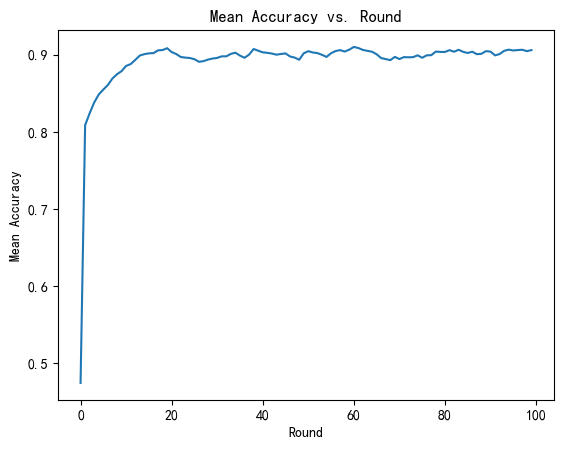

In [136]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取CSV文件
data = pd.read_csv('E:/FedStream/metrics/130K_binary_client_Sampling/FedNova/CovA_Abrupt_BtoVH/IncrementalSampling_epoch200_1/global_back.csv')

# 根据"rounds"列的值计算平均accuracy
grouped_data = data.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
# grouped_data.to_csv('C:/Users/张腾森/Desktop/grouped_data.csv', header=True)
# print(grouped_data)
# 提取"rounds"和平均accuracy的值
rounds_values = grouped_data.index.values
mean_acc = grouped_data.values

# 绘制图表
plt.plot(rounds_values, mean_acc)
plt.xlabel('Round')
plt.ylabel('Mean Accuracy')
plt.title('Mean Accuracy vs. Round')
plt.show()

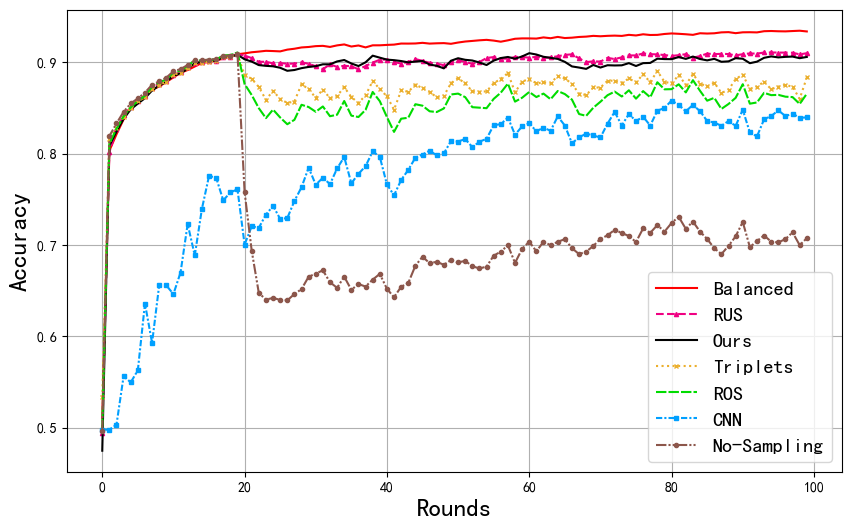

In [6]:
# 1-1.实验分析，
# 研究内容，类别不平衡增量变化，[50,50]->[98:2]的情况下，各种采样方式（'no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling'）对全局模型性能的影响。
# 先验条件 ，聚合算法 fedavg,客户端数量10，通信轮100，每轮每个客户端数据量100
# 实验数据地址：E:\FedStream\metrics\130K_binary_client_Sampling\FedAvg\CovA_Abrupt_BtoVH
# 基础实验结果文件夹，CondensedNearestNeighbour_epoch200_1
# Notion :triplets 在平衡状态下是不能运行的，因此，平衡状态保持原样，不平衡时运行
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'SimHei'
plt.rcParams['axes.unicode_minus'] = False

algorithm = 'FedNova'
base_path = 'E:/FedStream/metrics/130K_binary_client_Sampling'
setting_name = 'CovA_Abrupt_BtoVH'
# setting_name = 'covA_Incremental_10_dirF'
analysis_list =['RandomUnderSampler','IncrementalSampling','Triplets','RandomOverSampler','CondensedNearestNeighbour','no']
analysis_file = 'global_back.csv'
# rounds,accuracy,auc,kappa,g_mean,recall_micro,precision_micro,recall_macro,precision_macro,recall_0,precision_0,f1_score_0,recall_1,precision_1,f1_score_1
analysis_parameter = 'accuracy'
# read_result_path_list = []
fig, ax = plt.subplots(figsize=(10, 6))
# axins = ax.inset_axes([0, 0, 0.69, 0.47])  # 放大视图位置和大小
# color_list = ['tab:orange','black', 'tab:green', 'tab:purple', 'tab:cyan', 'tab:brown']
color_list = ['#f00082','black','#ebaf2d','#00dc00','#00a0ff','tab:brown']
label_list = ['RUS','Ours','Triplets','ROS','CNN','No-Sampling']
# label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
line_styles = ['--', '-', ':', (0, (5, 1)), (0, (3, 1, 1, 1)),(0, (5, 1, 1, 1, 1, 1))]
markers = ['^',None,'x',None,'s','o']
# 三角形：'^'倒三角形：'v'左三角形：'<'右三角形：'>'棱形：'D'正方形：'s'圆形：'o'叉形：'x'加号形：'+'菱形：'p'六边形：'h'
#Balaced result:
read_balanced_path = 'E:/FedStream/metrics/130K_binary_client_Sampling/FedNova/Balanced/no_epoch200_1/global_back.csv'
dfb = pd.read_csv(read_balanced_path)
# accuracyb = dfb['accuracy']
gdb = dfb.groupby('rounds')['accuracy'].mean()
xb = gdb.index.values
accuracyb=gdb.values
ax.plot(xb, accuracyb, color='red',linestyle='-', label='Balanced')
# axins.plot(xb, accuracyb, color='red', linestyle='-',label='Balanced')
for i,analysis in enumerate(analysis_list):
    # E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\CondensedNearestNeighbour_epoch200_1
    metric_path = os.path.join(base_path,algorithm,setting_name,f'{analysis}_epoch200_1','global_back.csv')
    # read_result_path_list.append(path)
    # print(f"{i}:",path)
    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 3, label=label_list[i])
    # axins.plot(x, accuracy, color=color_list[i], linestyle=line_styles[i],label=label_list[i])
# 设置放大视图的x轴和y轴范围
# axins.set_xlim(40,100)
# axins.set_ylim(0.885,0.935)

# 添加标题和标签
# ax.set_title('50/50->98/2,Abrupt,FedNova', fontsize=20)
ax.set_xlabel('Rounds', fontsize=18)
ax.set_ylabel('Accuracy', fontsize=18)

# 显示图例和网格线
ax.legend(fontsize=14.5)
ax.grid(True)

plt.show()

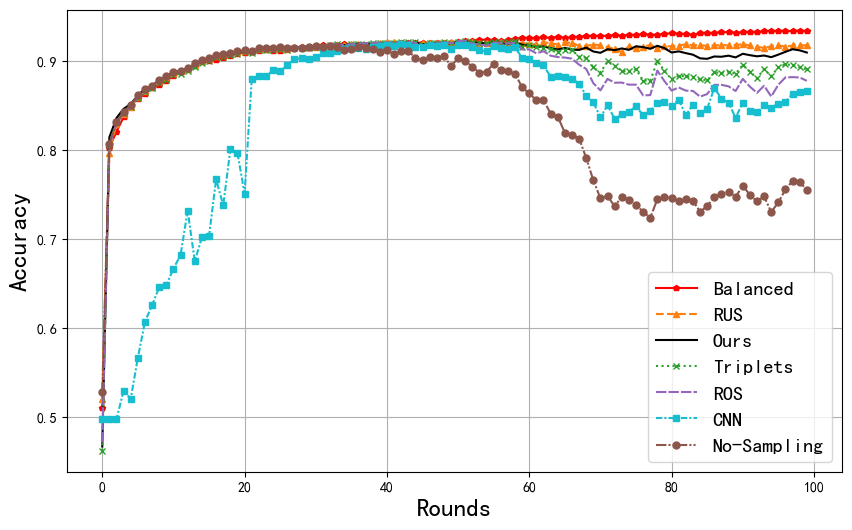

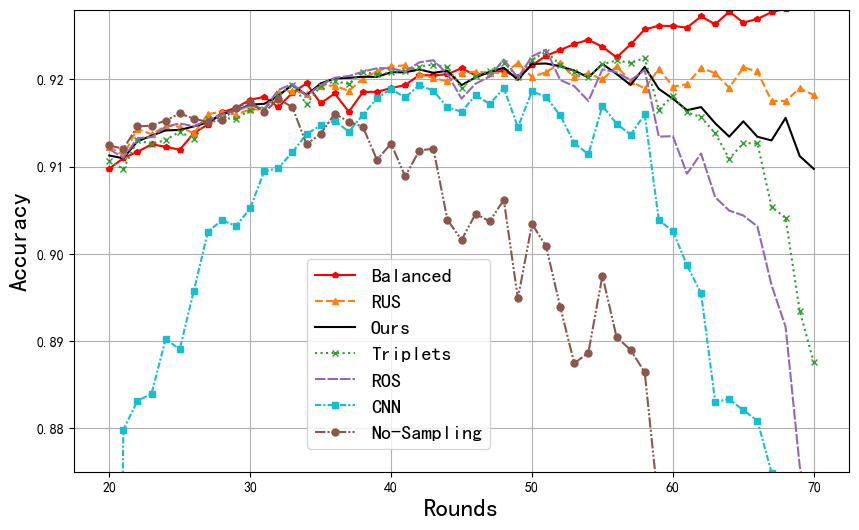

In [21]:
# 1-2.实验分析，
# 研究内容，类别不平衡增量变化，增量变化步长是50个通信轮，[50,50]->[98:2]的情况下，各种采样方式（'no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling'）对全局模型性能的影响。
# 先验条件 ，聚合算法 fedavg,客户端数量10，通信轮100，每轮每个客户端数据量100
# 实验数据地址：E:\FedStream\metrics\130K_binary_client_Sampling\FedAvg\CovA_Abrupt_BtoVH
# 基础实验结果文件夹，CondensedNearestNeighbour_epoch200_1
# Notion :triplets 在平衡状态下是不能运行的，因此，平衡状态保持原样，不平衡时运行
import os
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'SimHei'
plt.rcParams['axes.unicode_minus'] = False

algorithm = 'FedNova'
base_path = 'E:/FedStream/metrics/130K_binary_client_Sampling'
# setting_name = 'CovA_Abrupt_BtoVH'
setting_name = 'covA_Incremental_50_dirF'
analysis_list =['RandomUnderSampler','IncrementalSampling','Triplets','RandomOverSampler','CondensedNearestNeighbour','no']
analysis_file = 'global_back.csv'
# rounds,accuracy,auc,kappa,g_mean,recall_micro,precision_micro,recall_macro,precision_macro,recall_0,precision_0,f1_score_0,recall_1,precision_1,f1_score_1
analysis_parameter = 'accuracy'
# read_result_path_list = []
fig, ax = plt.subplots(figsize=(10, 6))
fig1, ax1 = plt.subplots(figsize=(10, 6))
# axins = ax.inset_axes([0.23, 0.05, 0.5, 0.50])  # 放大视图位置和大小
color_list = ['tab:orange','black', 'tab:green', 'tab:purple', 'tab:cyan', 'tab:brown']
label_list = ['RUS','Ours','Triplets','ROS','CNN','No-Sampling']
# label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
line_styles = ['--', '-', ':', (0, (5, 1)), (0, (3, 1, 1, 1)),(0, (5, 1, 1, 1, 1, 1))]
markers = ['^',None,'x',None,'s','o']
# 三角形：'^'倒三角形：'v'左三角形：'<'右三角形：'>'棱形：'D'正方形：'s'圆形：'o'叉形：'x'加号形：'+'菱形：'p'六边形：'h'
#Balaced result:
read_balanced_path = 'E:/FedStream/metrics/130K_binary_client_Sampling/FedNova/Balanced/no_epoch200_1/global_back.csv'
dfb = pd.read_csv(read_balanced_path)
# accuracyb = dfb['accuracy']
gdb = dfb.groupby('rounds')['accuracy'].mean()
xb = gdb.index.values
accuracyb=gdb.values
ax.plot(xb, accuracyb, color='red',linestyle='-',marker='p',markersize = 4, label='Balanced')
ax1.plot(xb[20:71], accuracyb[20:71], color='red',linestyle='-',marker='p',markersize = 4, label='Balanced')
# axins.plot(xb, accuracyb, color='red', linestyle='-',label='Balanced')
for i,analysis in enumerate(analysis_list):
    # E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\CondensedNearestNeighbour_epoch200_1
    metric_path = os.path.join(base_path,algorithm,setting_name,f'{analysis}_epoch200_1','global_back.csv')
    # read_result_path_list.append(path)
    # print(f"{i}:",path)
    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 5, label=label_list[i])
    ax1.plot(rounds[20:71], mean_accuracy[20:71], color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 5, label=label_list[i])
    # axins.plot(rounds, mean_accuracy, color=color_list[i], linestyle=line_styles[i],marker = markers[i],markersize = 3,label=label_list[i])
# 设置放大视图的x轴和y轴范围
# axins.set_xlim(38,65)
# axins.set_ylim(0.90,0.9235)

# 添加标题和标签
# ax.set_title('50/50->98/2,Incremental step50,FedNova', fontsize=20)
ax.set_xlabel('Rounds', fontsize=18)
ax.set_ylabel('Accuracy', fontsize=18)

# 显示图例和网格线
ax.legend(fontsize=14.5)
ax.grid(True)

ax1.set_ylim([0.875, 0.928])
# ax1.set_title('50/50->98/2,Incremental step50,FedNova', fontsize=20)
ax1.set_xlabel('Rounds', fontsize=18)
ax1.set_ylabel('Accuracy', fontsize=18)

# 显示图例和网格线
ax1.legend(fontsize=14.5,loc=(0.3,0.05))
ax1.grid(True)

plt.show()

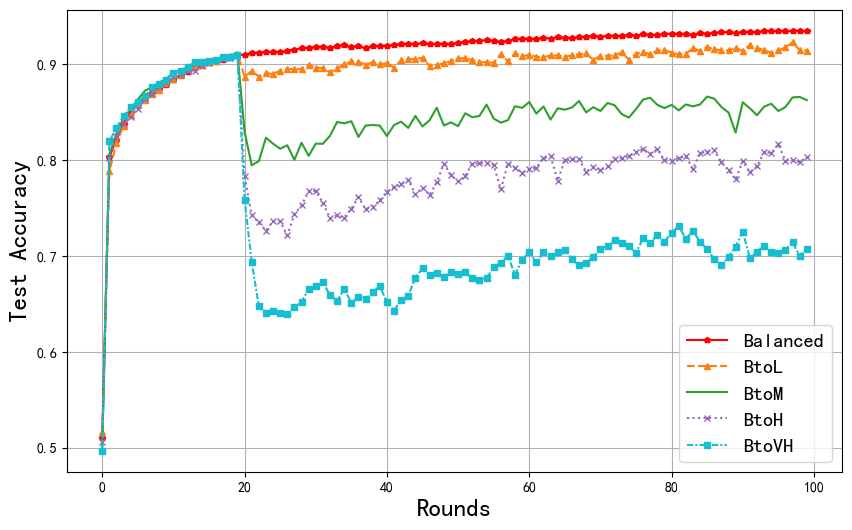

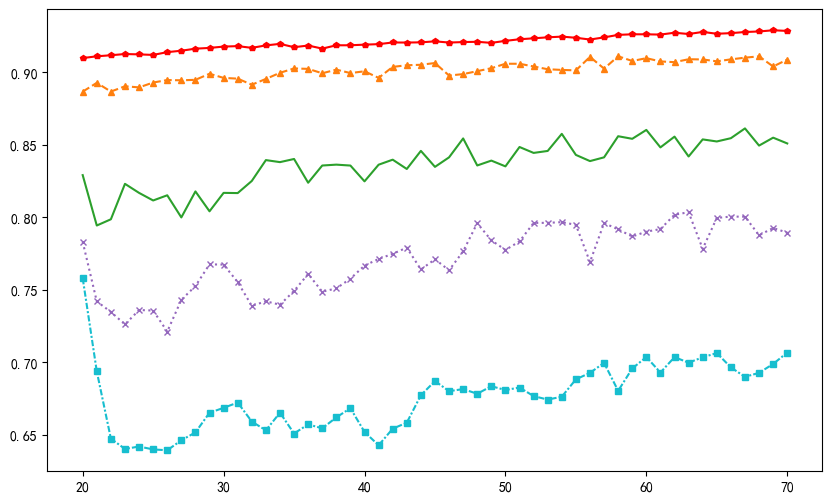

In [22]:
# 2.实验分析，
# 研究内容，类别不平衡突然变化的严重性对模型全局性能的影响
# 研究方法 BtoL[50:50]->[75:25],BtoM [50:50]->[90:10],BtoH [50:50]->[95:5],BtoVH [50:50]->[98:2],M0toM1 [0,100]->[100,0]
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'SimHei'
plt.rcParams['axes.unicode_minus'] = False

algorithm = 'FedNova'
base_path = 'E:/FedStream/metrics/130K_binary_client_Sampling'
# setting_name = 'CovA_Abrupt_BtoVH'
analysis_list = ['CovA_Abrupt_BtoL','CovA_Abrupt_BtoM','CovA_Abrupt_BtoH','CovA_Abrupt_BtoVH']
# analysis_list =['IncrementalSampling','RandomUnderSampler','Triplets','RandomOverSampler','no','CondensedNearestNeighbour']
sampling_name = 'no'
analysis_file = 'global_back.csv'
# rounds,accuracy,auc,kappa,g_mean,recall_micro,precision_micro,recall_macro,precision_macro,recall_0,precision_0,f1_score_0,recall_1,precision_1,f1_score_1
analysis_parameter = 'accuracy'
# read_result_path_list = []
fig, ax = plt.subplots(figsize=(10, 6))
fig1, ax1 = plt.subplots(figsize=(10, 6))
# axins = ax.inset_axes([0.23, 0.05, 0.5, 0.50])  # 放大视图位置和大小
color_list = ['tab:red','tab:orange', 'tab:green', 'tab:purple', 'tab:cyan','tab:red']
# label_list = ['50/50 (B)','75/25 (L)','90/10 (M)','95/5 (H)','98/2 (VH)','2/98 (VHR)']
label_list = ['BtoL','BtoM','BtoH','BtoVH']
# label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
line_styles = ['--', '-', ':', (0, (3, 1, 1, 1)) ]
markers = ['^',None,'x','s' ]
#Balaced result:
read_balanced_path = 'E:/FedStream/metrics/130K_binary_client_Sampling/FedNova/Balanced/no_epoch200_1/global_back.csv'
dfb = pd.read_csv(read_balanced_path)
gdb = dfb.groupby('rounds')['accuracy'].mean()
xb = gdb.index.values
accuracyb=gdb.values
ax.plot(xb, accuracyb, color='red',linestyle='-',marker='p',markersize = 4, label='Balanced')
ax1.plot(xb[20:71], accuracyb[20:71], color='red',linestyle='-',marker='p',markersize = 4, label='Balanced')
# axins.plot(xb, accuracyb, color='red', linestyle='-',label='Balanced')
# 'E:/FedStream/metrics/130K_binary_client_Sampling\\FedNova\\covA_Incremental_50_dirF\\CovA_Abrupt_BtoVH_epoch200_1\\global_back.csv'
for i,analysis in enumerate(analysis_list):
    # E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\CondensedNearestNeighbour_epoch200_1
    metric_path = os.path.join(base_path,algorithm,analysis,f'{sampling_name}_epoch200_1','global_back.csv')
    # read_result_path_list.append(path)
    # print(f"{i}:",path)
    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 5, label=label_list[i])
    ax1.plot(rounds[20:71], mean_accuracy[20:71], color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 5, label=label_list[i])
    # axins.plot(rounds, mean_accuracy, color=color_list[i], linestyle=line_styles[i],marker = markers[i],markersize = 3,label=label_list[i])
# 设置放大视图的x轴和y轴范围
# axins.set_xlim(38,65)
# axins.set_ylim(0.90,0.9235)

# 添加标题和标签
# ax.set_title('Abrupt change from balance to different imbalance severity', fontsize=20)
ax.set_xlabel('Rounds', fontsize=18)
ax.set_ylabel('Test Accuracy', fontsize=18)

# 显示图例和网格线
ax.legend(fontsize=14.5)
ax.grid(True)

plt.show()

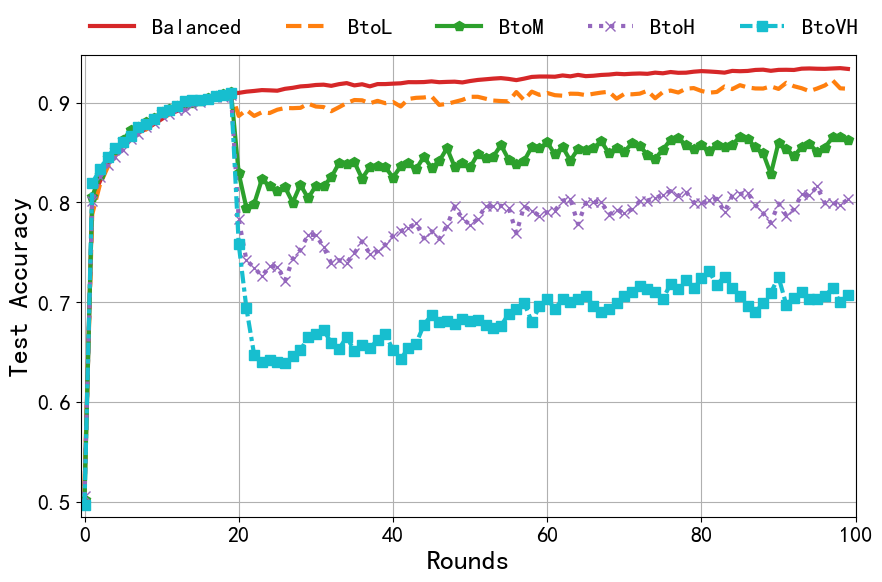

In [8]:
# 2.实验分析，
# 研究内容，覆盖率对全局模型的影响
# 研究方法 all-balanced[50,50],one-imbalance(cov9B),half-imbalance(covH),9-imbalance(cov1B),covA_VH(all is 98/2),covA_VHR(all is 2/98)
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'SimHei'
plt.rcParams['axes.unicode_minus'] = False

algorithm = 'FedNova'
base_path = 'E:/FedStream/metrics/130K_binary_client_Sampling'
# setting_name = 'CovA_Abrupt_BtoVH'
analysis_list = ['Balanced','CovA_Abrupt_BtoL','CovA_Abrupt_BtoM','CovA_Abrupt_BtoH','CovA_Abrupt_BtoVH']
# analysis_list =['IncrementalSampling','RandomUnderSampler','Triplets','RandomOverSampler','no','CondensedNearestNeighbour']
sampling_name = 'no'
analysis_file = 'global_back.csv'
# rounds,accuracy,auc,kappa,g_mean,recall_micro,precision_micro,recall_macro,precision_macro,recall_0,precision_0,f1_score_0,recall_1,precision_1,f1_score_1
analysis_parameter = 'accuracy'
# read_result_path_list = []
fig, ax = plt.subplots(figsize=(10, 6))
# fig1, ax1 = plt.subplots(figsize=(15, 6))
# axins = ax.inset_axes([0.23, 0.05, 0.5, 0.50])  # 放大视图位置和大小
color_list = ['tab:red','tab:orange', 'tab:green', 'tab:purple', 'tab:cyan','tab:red']
label_list = ['Balanced','BtoL','BtoM','BtoH','BtoVH']
# label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
line_styles = ['-','--', '-', ':', (0, (3, 1, 1, 1)),(0, (5, 1, 1, 1, 1, 1)) ]
markers = [None,None,'p','x','s','o' ]


for i,analysis in enumerate(analysis_list):
    # E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\CondensedNearestNeighbour_epoch200_1
    metric_path = os.path.join(base_path,algorithm,analysis,f'{sampling_name}_epoch200_1','global_back.csv')
    # read_result_path_list.append(path)
    # print(f"{i}:",path)
    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 7, label=label_list[i], linewidth=3)
    #ax1.plot(rounds[19:71], mean_accuracy[19:71], color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 7, label=label_list[i])

ax.set_xlim([-0.5, 100])
ax.set_ylim([0.485, 0.948])
ax.margins(x=0, y=0)
ax.set_xlabel('Rounds', fontsize=20)
ax.set_ylabel('Test Accuracy', fontsize=20)
# 修改x轴和y轴的标尺字体大小
ax.tick_params(axis='x', labelsize=16)  # 设置x轴标尺字体大小为16
ax.tick_params(axis='y', labelsize=16)  # 设置y轴标尺字体大小为16
# 显示图例和网格线, frameon=False去除外边框
ax.legend(loc=(0.0,1.02),fontsize=16, frameon=False, ncol=len(label_list)*1.5)

ax.grid(True)
# plt.savefig('C:/Users/张腾森/Desktop/severity1.pdf')
plt.show()


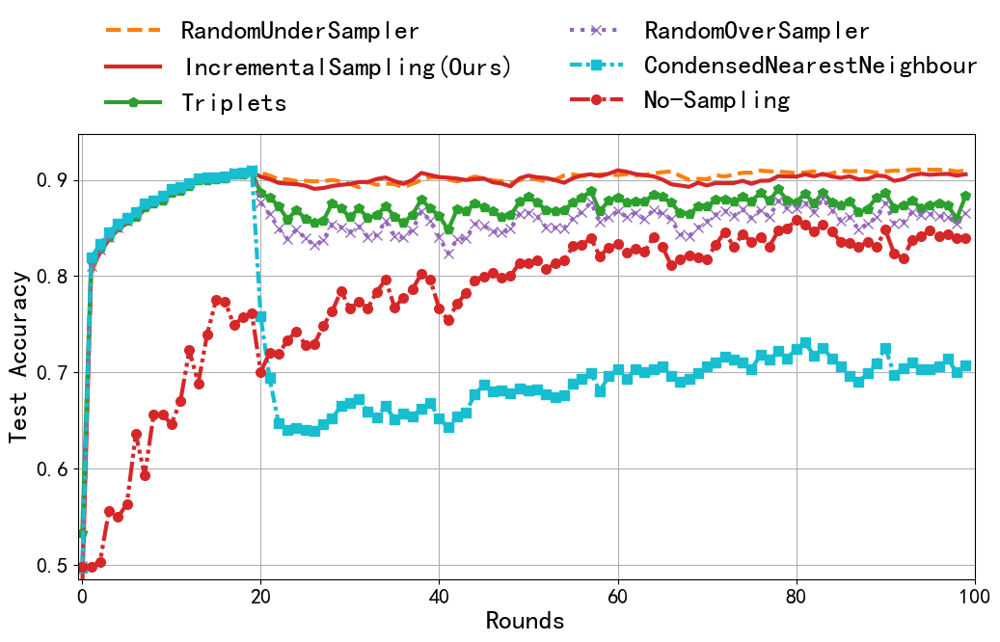

In [27]:
# 2.实验分析，
# 研究内容，覆盖率对全局模型的影响
# 研究方法 all-balanced[50,50],one-imbalance(cov9B),half-imbalance(covH),9-imbalance(cov1B),covA_VH(all is 98/2),covA_VHR(all is 2/98)
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'SimHei'
plt.rcParams['axes.unicode_minus'] = False

algorithm = 'FedNova'
base_path = 'E:/FedStream/metrics/130K_binary_client_Sampling'
setting_name = 'CovA_Abrupt_BtoVH'
analysis_list =['RandomUnderSampler','IncrementalSampling','Triplets','RandomOverSampler','no','CondensedNearestNeighbour']
sampling_name = 'no'
analysis_file = 'global_back.csv'
# rounds,accuracy,auc,kappa,g_mean,recall_micro,precision_micro,recall_macro,precision_macro,recall_0,precision_0,f1_score_0,recall_1,precision_1,f1_score_1
analysis_parameter = 'accuracy'
# read_result_path_list = []
fig, ax = plt.subplots(figsize=(12, 6))
# fig1, ax1 = plt.subplots(figsize=(15, 6))
# axins = ax.inset_axes([0.23, 0.05, 0.5, 0.50])  # 放大视图位置和大小
color_list = ['tab:orange','tab:red', 'tab:green', 'tab:purple', 'tab:cyan','tab:red']
# label_list = ['Balanced','BtoL','BtoM','BtoH','BtoVH']
label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
line_styles = ['--','-', '-', ':', (0, (3, 1, 1, 1)),(0, (5, 1, 1, 1, 1, 1)) ]
markers = [None,None,'p','x','s','o' ]


for i,analysis in enumerate(analysis_list):
    # E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\CondensedNearestNeighbour_epoch200_1
    # metric_path = os.path.join(base_path,algorithm,analysis,f'{sampling_name}_epoch200_1','global_back.csv')
    metric_path = os.path.join(base_path,algorithm,setting_name,f'{analysis}_epoch200_1','global_back.csv')
    # read_result_path_list.append(path)
    # print(f"{i}:",path)
    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 7, label=label_list[i], linewidth=3)
    #ax1.plot(rounds[19:71], mean_accuracy[19:71], color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 7, label=label_list[i])

ax.set_xlim([-0.5, 100])
ax.set_ylim([0.485, 0.948])
ax.margins(x=0, y=0)
ax.set_xlabel('Rounds', fontsize=20)
ax.set_ylabel('Test Accuracy', fontsize=20)
# 修改x轴和y轴的标尺字体大小
ax.tick_params(axis='x', labelsize=16)  # 设置x轴标尺字体大小为16
ax.tick_params(axis='y', labelsize=16)  # 设置y轴标尺字体大小为16
# 显示图例和网格线, frameon=False去除外边框
#ax.legend(loc=(0.0,1.02),fontsize=16, frameon=False, ncol=len(label_list)*1.5)
ax.legend(loc =(0.02,1.02),fontsize=20, frameon=False,ncol = 2)
ax.grid(True)
# plt.savefig('C:/Users/张腾森/Desktop/severity1.pdf')
plt.show()


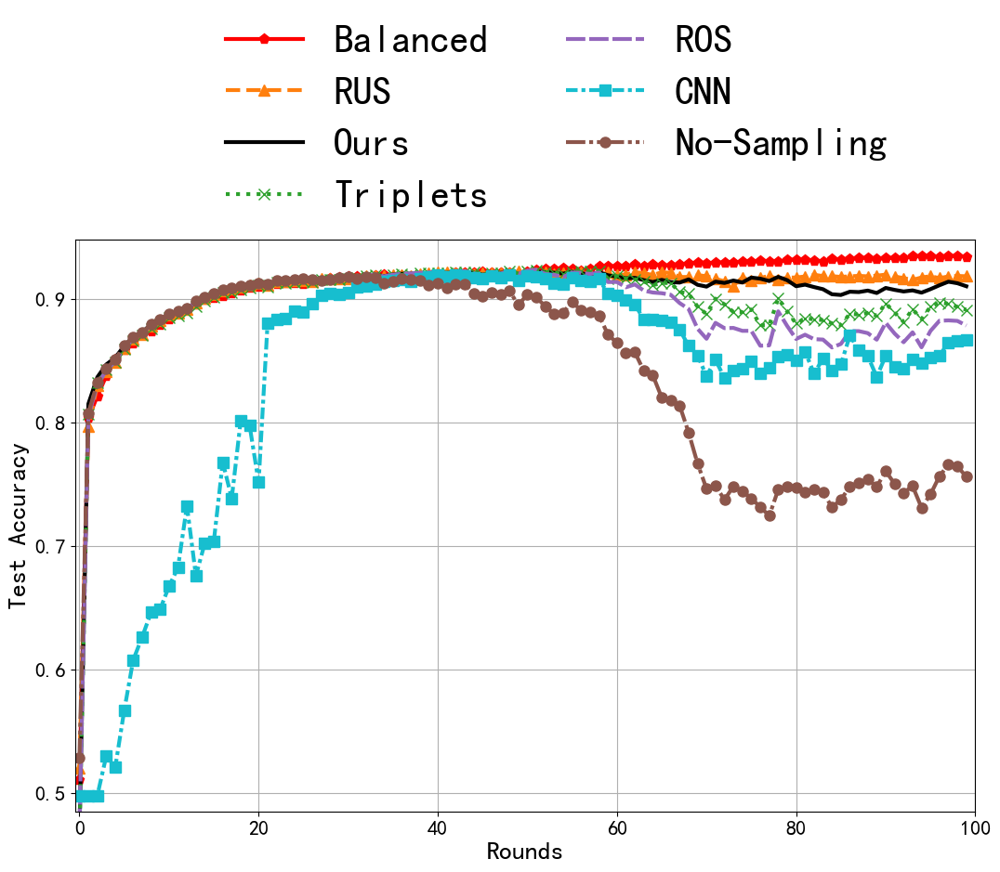

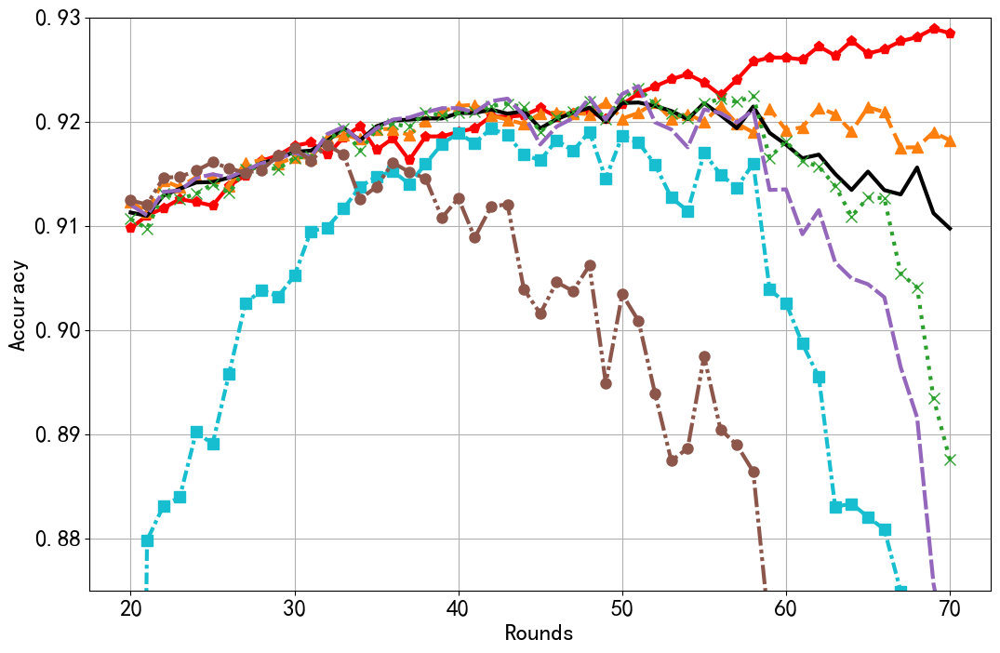

In [47]:
# 1-2.实验分析，
# 研究内容，类别不平衡增量变化，增量变化步长是50个通信轮，[50,50]->[98:2]的情况下，各种采样方式（'no','RandomOverSampler','RandomUnderSampler','CondensedNearestNeighbour','Triplets','IncrementalSampling'）对全局模型性能的影响。
# 先验条件 ，聚合算法 fedavg,客户端数量10，通信轮100，每轮每个客户端数据量100
# 实验数据地址：E:\FedStream\metrics\130K_binary_client_Sampling\FedAvg\CovA_Abrupt_BtoVH
# 基础实验结果文件夹，CondensedNearestNeighbour_epoch200_1
# Notion :triplets 在平衡状态下是不能运行的，因此，平衡状态保持原样，不平衡时运行
import os
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = 'SimHei'
plt.rcParams['axes.unicode_minus'] = False

algorithm = 'FedNova'
base_path = 'E:/FedStream/metrics/130K_binary_client_Sampling'
# setting_name = 'CovA_Abrupt_BtoVH'
setting_name = 'covA_Incremental_50_dirF'
analysis_list =['RandomUnderSampler','IncrementalSampling','Triplets','RandomOverSampler','CondensedNearestNeighbour','no']
analysis_file = 'global_back.csv'
# rounds,accuracy,auc,kappa,g_mean,recall_micro,precision_micro,recall_macro,precision_macro,recall_0,precision_0,f1_score_0,recall_1,precision_1,f1_score_1
analysis_parameter = 'accuracy'
# read_result_path_list = []
fig, ax = plt.subplots(figsize=(12.5, 8))
fig1, ax1 = plt.subplots(figsize=(12.5, 8))
# axins = ax.inset_axes([0.23, 0.05, 0.5, 0.50])  # 放大视图位置和大小
color_list = ['tab:orange','black', 'tab:green', 'tab:purple', 'tab:cyan', 'tab:brown']
label_list = ['RUS','Ours','Triplets','ROS','CNN','No-Sampling']
# label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
# label_list = ['RandomUnderSampler','IncrementalSampling(Ours)','Triplets','RandomOverSampler','CondensedNearestNeighbour','No-Sampling']
line_styles = ['--', '-', ':', (0, (5, 1)), (0, (3, 1, 1, 1)),(0, (5, 1, 1, 1, 1, 1))]
markers = ['^',None,'x',None,'s','o']
# 三角形：'^'倒三角形：'v'左三角形：'<'右三角形：'>'棱形：'D'正方形：'s'圆形：'o'叉形：'x'加号形：'+'菱形：'p'六边形：'h'
#Balaced result:
read_balanced_path = 'E:/FedStream/metrics/130K_binary_client_Sampling/FedNova/Balanced/no_epoch200_1/global_back.csv'
dfb = pd.read_csv(read_balanced_path)
# accuracyb = dfb['accuracy']
gdb = dfb.groupby('rounds')['accuracy'].mean()
xb = gdb.index.values
accuracyb=gdb.values
ax.plot(xb, accuracyb, color='red',linestyle='-',marker='p',markersize = 8, label='Balanced',linewidth=3)
ax1.plot(xb[20:71], accuracyb[20:71], color='red',linestyle='-',marker='p',markersize = 8, label='Balanced',linewidth=3)
# axins.plot(xb, accuracyb, color='red', linestyle='-',label='Balanced')
for i,analysis in enumerate(analysis_list):
    # E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\CondensedNearestNeighbour_epoch200_1
    metric_path = os.path.join(base_path,algorithm,setting_name,f'{analysis}_epoch200_1','global_back.csv')
    # read_result_path_list.append(path)
    # print(f"{i}:",path)
    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 8, label=label_list[i],linewidth=3)
    ax1.plot(rounds[20:71], mean_accuracy[20:71], color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 8, label=label_list[i],linewidth=3)
    # axins.plot(rounds, mean_accuracy, color=color_list[i], linestyle=line_styles[i],marker = markers[i],markersize = 3,label=label_list[i])
# 设置放大视图的x轴和y轴范围
# axins.set_xlim(38,65)
# axins.set_ylim(0.90,0.9235)

# 添加标题和标签
# ax.set_title('50/50->98/2,Incremental step50,FedNova', fontsize=20)
ax.set_xlim([-0.5, 100])
ax.set_ylim([0.485, 0.948])
ax.margins(x=0, y=0)
ax.set_xlabel('Rounds', fontsize=20)
ax.set_ylabel('Test Accuracy', fontsize=20)
# 修改x轴和y轴的标尺字体大小
ax.tick_params(axis='x', labelsize=16)  # 设置x轴标尺字体大小为16
ax.tick_params(axis='y', labelsize=16)  # 设置y轴标尺字体大小为16
# 显示图例和网格线, frameon=False去除外边框
#ax.legend(loc=(0.0,1.02),fontsize=16, frameon=False, ncol=len(label_list)*1.5)
ax.legend(loc =(0.15,1.02),fontsize=30, frameon=False,ncol = 2)


ax.grid(True)
# plt.savefig('C:/Users/张腾森/Desktop/severity1.pdf')
# plt.show()

ax1.set_ylim([0.875, 0.930])
# ax1.set_title('50/50->98/2,Incremental step50,FedNova', fontsize=20)
ax1.set_xlabel('Rounds', fontsize=18)
ax1.set_ylabel('Accuracy', fontsize=18)
ax1.tick_params(axis='x', labelsize=18)  # 设置x轴标尺字体大小为16
ax1.tick_params(axis='y', labelsize=18)  # 设置y轴标尺字体大小为16

# 显示图例和网格线
# ax1.legend(fontsize=14.5,loc=(0.3,0.05))
ax1.grid(True)

plt.show()

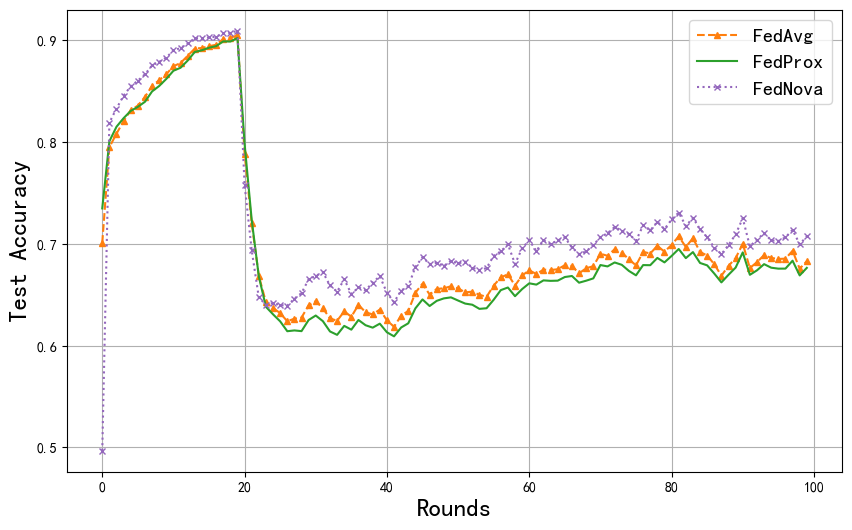

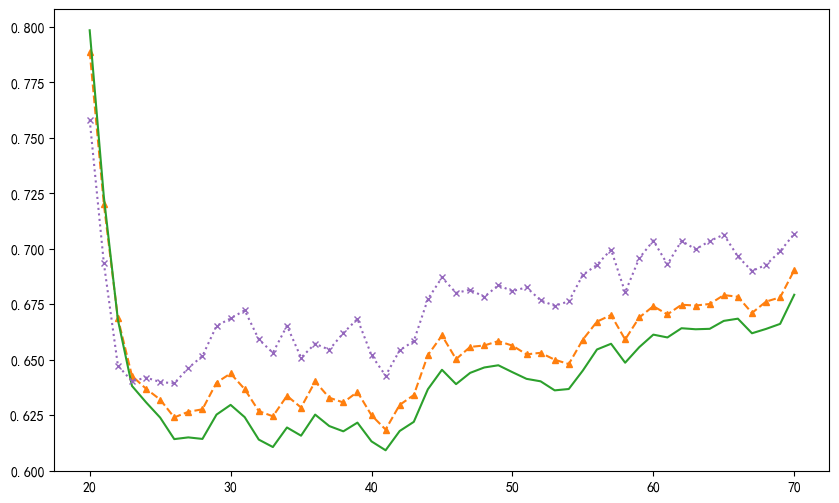

In [23]:
# 3.实验分析，
# 研究内容，3种聚合方法（FedAvg,FedProx,FedNova）对模型性能的影响
basePath = 'E:/FedStream/metrics/130K_binary_client_Sampling'
analysis_list = ['FedAvg','FedProx','FedNova']
setting_name = 'CovA_Abrupt_BtoVH'
sampling_name = 'no'
analysis_parameter = 'accuracy'
# metric_path = os.path.join(base_path,analysis,setting_name,f'{sampling_name}_epoch200_1','global_back.csv')
fig, ax = plt.subplots(figsize=(10, 6))
fig1, ax1 = plt.subplots(figsize=(10, 6))
color_list = ['tab:orange', 'tab:green', 'tab:purple']
label_list = ['FedAvg','FedProx','FedNova']
line_styles = ['--', '-', ':']
markers = ['^',None,'x' ]
read_balanced_path = 'E:/FedStream/metrics/130K_binary_client_Sampling/FedNova/Balanced/no_epoch200_1/global_back.csv'
# dfb = pd.read_csv(read_balanced_path)
# gdb = dfb.groupby('rounds')['accuracy'].mean()
# xb = gdb.index.values
# accuracyb=gdb.values
# ax.plot(xb, accuracyb, color='red',linestyle='-',marker='p',markersize = 4, label='Balanced')
# ax1.plot(xb[20:71], accuracyb[20:71], color='red',linestyle='-',marker='p',markersize = 4, label='Balanced')
for i,analysis in enumerate(analysis_list):
    # path = 'E:\FedStream\metrics\130K_binary_client_Sampling\FedProx\CovA_Abrupt_BtoVH\no_epoch200_1/global_back.csv'
    metric_path = os.path.join(base_path,analysis,setting_name,f'{sampling_name}_epoch200_1','global_back.csv')

    df = pd.read_csv(metric_path)
        # 提取准确率数据
    # accuracy = df['accuracy']
    grouped_data = df.groupby('rounds')['accuracy'].mean()#.apply(list).reset_index() # .mean()
    rounds = grouped_data.index.values
    mean_accuracy = grouped_data.values
    # x = np.arange(len(accuracy))

    # 绘制准确率图表
    ax.plot(rounds, mean_accuracy, color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 5, label=label_list[i])
    ax1.plot(rounds[20:71], mean_accuracy[20:71], color=color_list[i],linestyle=line_styles[i],marker = markers[i],markersize = 5, label=label_list[i])
    ax.set_xlabel('Rounds', fontsize=18)
ax.set_ylabel('Test Accuracy', fontsize=18)

# 显示图例和网格线
ax.legend(fontsize=14.5)
ax.grid(True)

plt.show()